In [1]:
import numpy as np
import pgeocode
import pandas as pd
#setting the location as India for pgeocode
nomi = pgeocode.Nominatim('in')


In [1]:
!pip install pgeocode

In [165]:
#reading our data
df=pd.read_csv('D:/Downloads/project_final.csv')


In [166]:
df.tail(20)

,ORDER_ID,CUSTOMER_ID,BREAD_SUBSCRIBER,MILK_SUBSCRIBER,CITY,STATE,POSTCODE,ORDER_ITEMS,ITEM_CATEGORIES,VENDOR_ATTRIBUTE
19063,12593,198,not-bread-subscriber,not-milk-subscriber,New Delhi,DL,110048,"Jowar Atta (1 kg), Bajra / Pearl millet flour ...",Indian Grocery,Desi Utpad by Jaya
19064,38029,4924,not-bread-subscriber,not-milk-subscriber,Gurgaon,HR,122003,"Seeded Gluten Free Bread, Seeded Gluten Free B...",Freshly Baked,Miche Artisanal Bakery
19065,23554,109,not-bread-subscriber,not-milk-subscriber,Delhi,NaN,110074,"French Beans (500 gm), Mushroom - 200 gms pkt,...",Fruits &amp; Veggies,"Kyssa Farms,Desi Utpad by Jaya"
19066,26073,100,not-bread-subscriber,not-milk-subscriber,New Delhi,NaN,110016,"Chocolate Croissant (1 pc), Chocolate Croissan...","Freshly Baked,Dairy,Spreads &amp; Sauces",Organic German Bake Shop
19067,39149,945,not-bread-subscriber,not-milk-subscriber,Delhi,DL,NaN,"Pomegranate (500 gm), Pomegranate (500 gm), On...",Fruits &amp; Veggies,"Desi Utpad by Jaya,Kyssa Farms"
19068,21342,2041,not-bread-subscriber,not-milk-subscriber,Gurgaon,HR,NaN,"Ricotta Cheese (200 gm), Ricotta Cheese (200 g...","Dairy,Spreads &amp; Sauces",Organic German Bake Shop
19069,22017,3097,not-bread-subscriber,not-milk-subscriber,Gurgaon,HR,122011,"Bitter Gourd (500 gm), Green Peas - Matar (500...",Fruits &amp; Veggies,"Desi Utpad by Jaya,Kyssa Farms"
19070,14650,1616,not-bread-subscriber,not-milk-subscriber,NaN,NaN,NaN,"Chikoo (500 g), Mango banganapalli (500g), Ana...",Fruits &amp; Veggies,Kyssa Farms
19071,52988,5747,not-bread-subscriber,not-milk-subscriber,Gurgaon,Dehli,122002,"Multigrain Sourdough Bread (500 g), Multigrai...",Freshly Baked,Organic German Bake Shop
19072,23050,1125,not-bread-subscriber,not-milk-subscriber,Delhi,DL,110026,Classic French Style Sourdough Bread (500 g),NaN,NaN


In [167]:
df.shape

(19083, 10)

In [168]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19083 entries, 0 to 19082
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   ORDER_ID          19083 non-null  int64 
 1   CUSTOMER_ID       19083 non-null  int64 
 2   BREAD_SUBSCRIBER  19083 non-null  object
 3   MILK_SUBSCRIBER   19083 non-null  object
 4   CITY              18395 non-null  object
 5   STATE             16492 non-null  object
 6   POSTCODE          16262 non-null  object
 7   ORDER_ITEMS       19083 non-null  object
 8   ITEM_CATEGORIES   15326 non-null  object
 9   VENDOR_ATTRIBUTE  15025 non-null  object
dtypes: int64(2), object(8)
memory usage: 1.5+ MB


In [169]:
#drop rows with missing values in both postcode and state columns
df=df.dropna(subset=['STATE','POSTCODE'],how='all')

In [170]:
df.shape

(18406, 10)

In [171]:
df=df.reset_index()

In [172]:
#replacing null values of state by the state procured through postcode column
for i in range(len(df)):
    if type(df['STATE'][i])==float:
            df['STATE']=df['STATE'].replace(np.nan,nomi.query_postal_code(str(df['POSTCODE'][i])).state_name)

In [173]:
#missing values in the dataset
df.isna().sum()

index                  0
ORDER_ID               0
CUSTOMER_ID            0
BREAD_SUBSCRIBER       0
MILK_SUBSCRIBER        0
CITY                 165
STATE                  0
POSTCODE            2144
ORDER_ITEMS            0
ITEM_CATEGORIES     3632
VENDOR_ATTRIBUTE    3894
dtype: int64

In [174]:
#Checking for the unique values in STATE Column
df['STATE'].unique()

array(['UP', 'DL', 'Dehli', 'HR', 'Uttar Pradesh', 'Haryana', 'India',
       'Delhi', 'Uttar pradesh', 'Hayana', 'New Delhi', 'delhi', 'dehli',
       'Uttar pardesh', 'UK', 'haryana', 'Delh', 'GA', 'HARYANA',
       'Harayana', 'DELHI', '9.1851E+11', 'New Delhi, India', '110015',
       'Utar pardesh'], dtype=object)

In [175]:
#Converting all values of STATE to uppercase
df['STATE']=df['STATE'].str.upper()

In [176]:
#replacing the values with DL, HR and UP for a uniformed result
DL=['DELHI','DEHLI','NEW DELHI','DELH','NEW DELHI, INDIA']
UP=['UTTAR PRADESH','UTAR PARDESH','UTTAR PARDESH','UK']
HR=['HARYANA','HAYANA','HARAYANA']
EX=['INDIA', 'GA', '9.1851E+11', '110015']
df['STATE']=df['STATE'].replace(DL,'DL')
df['STATE']=df['STATE'].replace(UP,'UP')
df['STATE']=df['STATE'].replace(HR,'HR')
df=df[df['STATE']!='INDIA']
df=df[df['STATE']!='110015']
df=df[df['STATE']!='GA']
df=df[df['STATE']!='9.1851E+11']


In [177]:
df['STATE'].unique()

array(['UP', 'DL', 'HR'], dtype=object)

In [15]:
df=df.reset_index()

In [16]:
#dropping columns POSTCODE and CITY because they would not be needed in further analysis 
#and they contain multiple missing values
df.drop(['POSTCODE','CITY'],axis='columns',inplace=True)

In [17]:
#Encoding the milk and bread subscriber column
from sklearn import preprocessing
 
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()
 
# Encode labels in column 'species'.
df['BREAD_SUBSCRIBER']= label_encoder.fit_transform(df['BREAD_SUBSCRIBER'])
 
df['BREAD_SUBSCRIBER'].unique()

array([1, 0])

In [18]:
from sklearn import preprocessing
 
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()
 
# Encode labels in column 'species'.
df['MILK_SUBSCRIBER']= label_encoder.fit_transform(df['MILK_SUBSCRIBER'])
 
df['MILK_SUBSCRIBER'].unique()

array([1, 0])

In [19]:
#Converting the order items values into a list
for i in range(len(df)):
    df['ORDER_ITEMS'][i]=df['ORDER_ITEMS'][i].split(',')

<ipython-input-19-f85d29f2e55b>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ORDER_ITEMS'][i]=df['ORDER_ITEMS'][i].split(',')


In [20]:
#Converting the item category values into a string for further conversion into list
df['ITEM_CATEGORIES']=df['ITEM_CATEGORIES'].astype(str)

In [21]:
#Converting the item category values into a list
for i in range(len(df)):
    df['ITEM_CATEGORIES'][i]=df['ITEM_CATEGORIES'][i].split(',')

<ipython-input-21-33cd81eb028b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ITEM_CATEGORIES'][i]=df['ITEM_CATEGORIES'][i].split(',')


In [22]:
#Replacing the missing values using keywords and finding products belonging to the same category
B=['Cheese','Milk','Ghee']
for i in range(len(df)):
    if df['ITEM_CATEGORIES'][i]==['nan']:
        #print(df['ITEM_CATEGORIES'][i])
        for j in range(len(df['ORDER_ITEMS'][i])):
            #print(df['ORDER_ITEMS'][i][j].split())
            if (any( x in df['ORDER_ITEMS'][i][j].split() for x in B)):
                print(df['ORDER_ITEMS'][i][j].split())
                df['ITEM_CATEGORIES'][i]=['Dairy']
    else:
        #print(df['ITEM_CATEGORIES'][i])
        for j in range(len(df['ORDER_ITEMS'][i])):
            #print(df['ORDER_ITEMS'][i][j].split())
            if (any( x in df['ORDER_ITEMS'][i][j].split() for x in B)):
                print(df['ORDER_ITEMS'][i][j].split())
                for k in range(len(df['ITEM_CATEGORIES'][i])):
                    if df['ITEM_CATEGORIES'][i][k]!='Dairy':
                        df['ITEM_CATEGORIES'][i].append('Dairy')

['Gruyere', 'Cheese', '(200', 'gm)']
['Gruyere', 'Cheese', '(200', 'gm)']
['Feta', 'Cheese', 'Kodai', '(200', 'gm)']
['Feta', 'Cheese', 'Kodai', '(200', 'gm)']
['Gouda', 'Cheese', 'Kodai', '(200', 'gm)']
['Gouda', 'Cheese', 'Kodai', '(200', 'gm)']
['Himalayan', 'Montasio', 'Cheese', '(200', 'g)']
['Everything', 'Bagel', '(Pack', 'of', '2)', '+', 'Cream', 'Cheese', '(25', 'g)']
['Everything', 'Bagel', '(Pack', 'of', '2)', '+', 'Cream', 'Cheese', '(25', 'g)']
['Jalapeno', 'Bagels', '&amp;', 'Cheese']
['Organic', 'A2', 'Milk', '(Whole)', '(1', 'litre)']
['Organic', 'A2', 'Milk', '(Whole)', '(1', 'litre)']
['Tasty', 'Cheddar', 'Cheese', '(200', 'gm)']
['Tasty', 'Cheddar', 'Cheese', '(200', 'gm)']
['Everything', 'Bagel', '(Pack', 'of', '2)', '+', 'Cream', 'Cheese', '(25', 'g)']
['Everything', 'Bagel', '(Pack', 'of', '2)', '+', 'Cream', 'Cheese', '(25', 'g)']
['Cheddar', 'Cheese', 'Kodai', '(200', 'gm)']
['Cheddar', 'Cheese', 'Kodai', '(200', 'gm)']
['Tasty', 'Cheddar', 'Cheese', '(200', 'gm

<ipython-input-22-a36b15d309b6>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ITEM_CATEGORIES'][i]=['Dairy']



['Organic', 'A2', 'Milk', '(Skimmed)', '(1', 'Litre)']
['A2', 'Skimmed', 'Milk', 'Trial', '-', '1', 'litre']
['A2', 'Milk', '(Whole)', '(1', 'Litre)']
['A2', 'Whole', 'Milk', 'Trial', '-', '1', 'litre']
['Jalapeno', 'Bagels', '&amp;', 'Cheese']
['Organic', 'A2', 'Milk', '(Skimmed)', '(1', 'Litre)']
['Organic', 'A2', 'Milk', '(Skimmed)', '(1', 'Litre)']
['Organic', 'A2', 'Milk', '(Skimmed)', '(1', 'Litre)']
['Organic', 'A2', 'Milk', '(Skimmed)', '(1', 'Litre)']
['Cheddar', 'Cheese', '(200gm)']
['Cheddar', 'Cheese', '(200gm)']
['Gouda', 'Cheese', '(200gm)']
['Gouda', 'Cheese', '(200gm)']
['Gouda', 'Cheese', '(200gm)']
['Cream', 'Cheese', '(200g)']
['Cream', 'Cheese', '(200g)']
['Ricotta', 'Cheese', '(200', 'gm)']
['Ricotta', 'Cheese', '(200', 'gm)']
['Everything', 'Bagel', '(Pack', 'of', '2)', '+', 'Cream', 'Cheese', '(25', 'g)']
['Everything', 'Bagel', '(Pack', 'of', '2)', '+', 'Cream', 'Cheese', '(25', 'g)']
['A2', 'Milk', '(Whole)', '(1', 'Litre)']
['A2', 'Milk', '(Whole)', '(1', 'Li

In [23]:
#Replacing the missing values using keywords and finding products belonging to the same category
S=['Butter','Jam','Hummus','Dip','Sauce','Dips']
for i in range(len(df)):
    if df['ITEM_CATEGORIES'][i]==['nan']:
        #print(df['ITEM_CATEGORIES'][i])
        for j in range(len(df['ORDER_ITEMS'][i])):
            #print(df['ORDER_ITEMS'][i][j].split())
            if (any( x in df['ORDER_ITEMS'][i][j].split() for x in S)):
                print(df['ORDER_ITEMS'][i][j].split())
                df['ITEM_CATEGORIES'][i]=['Spreads &amp; Sauces']
    else:
        #print(df['ITEM_CATEGORIES'][i])
        for j in range(len(df['ORDER_ITEMS'][i])):
            #print(df['ORDER_ITEMS'][i][j].split())
            if (any( x in df['ORDER_ITEMS'][i][j].split() for x in S)):
                print(df['ORDER_ITEMS'][i][j].split())
                for k in range(len(df['ITEM_CATEGORIES'][i])):
                    if df['ITEM_CATEGORIES'][i][k]!='Spreads &amp; Sauces':
                        df['ITEM_CATEGORIES'][i].append('Spreads &amp; Sauces')

['Cashew', 'Butter', '(200', 'gm)']
['Cashew', 'Butter', '(200', 'gm)']
['Cashew', 'Butter', '(200', 'gm)']
['Onion', 'Jam', '(210', 'gm)']
['Onion', 'Jam', '(210', 'gm)']
['Strawberry', 'Jam', '(', '250', 'gm)']
['Strawberry', 'Jam', '(', '250', 'gm)']
['Strawberry', 'Jam', '(', '250', 'gm)']
['Strawberry', 'Jam', '(', '250', 'gm)']
['Tomato', 'Pasta', 'Sauce', '(250', 'gms)']
['Tomato', 'Pasta', 'Sauce', '(250', 'gms)']
['Tomato', 'Pasta', 'Sauce', '(250', 'gms)']
['Tomato', 'Pasta', 'Sauce', '(250', 'gms)']
['Mango', 'Jam', '(250', 'gm)']
['Mango', 'Jam', '(250', 'gm)']
['Mango', 'Jam', '(250', 'gm)']
['Hummus', '(250', 'gms)']
['Hummus', '(250', 'gms)']
['Hummus', '(250', 'gms)']
['Hummus', '(250', 'gms)']
['Hummus', '(250', 'gms)']
['Hummus', '(250', 'gms)']
['Tomato', 'Pasta', 'Sauce', '(250', 'gms)']
['Tomato', 'Pasta', 'Sauce', '(250', 'gms)']
['Tomato', 'Pasta', 'Sauce', '(250', 'gms)']
['Tomato', 'Pasta', 'Sauce', '(250', 'gms)']
['Hummus', '(250', 'gms)']
['Hummus', '(250', 

<ipython-input-23-a005a82c6f62>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ITEM_CATEGORIES'][i]=['Spreads &amp; Sauces']


['Bili', 'Hu', 'Cold', 'Brew', 'Dip', 'Bags']
['Bili', 'Hu', 'Cold', 'Brew', 'Dip', 'Bags']
['Hummus', '(250', 'gms)']
['Hummus', '(250', 'gms)']
['Hummus', '(250', 'gms)']
['Hummus', '(210', 'gms)']
['Butter', 'Croissant', '(1', 'pc)', '-', '100%', 'Veg', '-', 'No', 'Eggs']
['Hummus', '(210', 'gms)']
['Aglio', 'Olio', 'Dip', '(180gm)']
['Aglio', 'Olio', 'Dip', '(180gm)']
['Aglio', 'Olio', 'Dip', '(180gm)']
['Aglio', 'Olio', 'Dip', '(180gm)']
['Butter', 'Croissant', '(1', 'pc)', '-', '100%', 'Veg', '-', 'No', 'Eggs']
['Hummus', '(250', 'gms)']
['Hummus', '(250', 'gms)']
['Hummus', '(250', 'gms)']
['Aglio', 'Olio', 'Dip', '(180gm)']
['Aglio', 'Olio', 'Dip', '(180gm)']
['Aglio', 'Olio', 'Dip', '(180gm)']
['Aglio', 'Olio', 'Dip', '(180gm)']
['Butter', 'Croissant', '(1', 'pc)']
['Butter', 'Croissant', '(1', 'pc)']
['Butter', 'Croissant', '(1', 'pc)']
['Hummus', '(210', 'gms)']
['Hummus', '(250', 'gms)']
['Hummus', '(250', 'gms)']
['Hummus', '(250', 'gms)']
['Peanut', 'Butter', '(200', 'g)'

In [24]:
#Replacing the missing values using keywords and finding products belonging to the same category
C=['Bread','bread','Bagels','Croissant','Loaf','Pretzel','Bakery','Bagel','Croissants']
for i in range(len(df)):
    if df['ITEM_CATEGORIES'][i]==['nan']:
        #print(df['ITEM_CATEGORIES'][i])
        for j in range(len(df['ORDER_ITEMS'][i])):
            #print(df['ORDER_ITEMS'][i][j].split())
            if (any( x in df['ORDER_ITEMS'][i][j].split() for x in C)):
                print(df['ORDER_ITEMS'][i][j].split())
                df['ITEM_CATEGORIES'][i]=['Freshly Baked']
    else:
        #print(df['ITEM_CATEGORIES'][i])
        for j in range(len(df['ORDER_ITEMS'][i])):
            #print(df['ORDER_ITEMS'][i][j].split())
            if (any( x in df['ORDER_ITEMS'][i][j].split() for x in C)):
                print(df['ORDER_ITEMS'][i][j].split())
                for k in range(len(df['ITEM_CATEGORIES'][i])):
                    if df['ITEM_CATEGORIES'][i][k]!='Freshly Baked':
                        df['ITEM_CATEGORIES'][i].append('Freshly Baked')

['Amaranth', 'Bread', '(Gluten', 'free', '&amp;', 'Vegan)', '(1', 'loaf', '(500gm))']
['Rye', 'Ragi', 'Bread', '(500', 'g)']
['Miche', 'Whole', 'Wheat', 'Sourdough', 'Bread', '(550g)']
['Miche', 'Whole', 'Wheat', 'Sourdough', 'Bread', '(550g)']
['Fresh', 'Sourdough', 'Bread', 'Subscription', '|', '1', 'Loaf', 'per', 'week', '@', 'Rs', '200', '|', '4', 'per', 'month']
['Fresh', 'Sourdough', 'Bread', 'Subscription', '|', '1', 'Loaf', 'per', 'week', '@', 'Rs', '200', '|', '4', 'per', 'month']
['German', 'Country', 'Rye', 'Bread', '(', '500', 'gm)']
['Buckwheat', 'Bread', '(Gluten', 'free', '&amp;', 'Vegan)', '(1', 'loaf', '(500gm))']
['Everything', 'Bagel', '(Pack', 'of', '2)', '+', 'Cream', 'Cheese', '(25', 'g)']
['Everything', 'Bagel', '(Pack', 'of', '2)', '+', 'Cream', 'Cheese', '(25', 'g)']
['Sesame', 'Bagels', '(Pack', 'of', '2)+', 'cream', 'cheese', '(25gram)']
['Sesame', 'Bagels', '(Pack', 'of', '2)+', 'cream', 'cheese', '(25gram)']
['Jalapeno', 'Bagels', '&amp;', 'Cheese']
['Multi

<ipython-input-24-192d522224f1>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ITEM_CATEGORIES'][i]=['Freshly Baked']



['Multigrain', 'Sandwich', 'Loaf', '(400', 'g)']
['Sourdough', 'Sandwich', 'Loaf', 'Bread', '(650g)']
['German', 'Pretzel', '(Laugen', 'brezel)(1', 'pc)']
['Chocolate', 'Croissant', '(1', 'pc)']
['Chocolate', 'Croissant', '(1', 'pc)']
['Chocolate', 'Croissant', '(1', 'pc)']
['Chocolate', 'Croissant', '(1', 'pc)']
['Sesame', 'Bagels', '(Pack', 'of', '2)']
['Whole', 'Wheat', 'Sandwich', 'Loaf', '(400', 'g)']
['Whole', 'Wheat', 'Sandwich', 'Loaf', '(400', 'g)']
['Miche', 'Whole', 'Wheat', 'Sourdough', 'Bread', '(550g)']
['Miche', 'Whole', 'Wheat', 'Sourdough', 'Bread', '(550g)']
['German', 'Country', 'Rye', 'Bread', '(', '500', 'gm)']
['Jowar', '&amp;', 'Ragi', 'Gluten-free', 'bread', '(700', 'g)']
['Butter', 'Croissant', '(1', 'pc)', '-', '100%', 'Veg', '-', 'No', 'Eggs']
['Jowar', '&', 'Ragi', 'Gluten-free', 'bread', '(700', 'g)']
['German', 'Country', 'Rye', 'Bread', '(', '500', 'gm)']
['Quinoa', 'Bread', '(Gluten', 'free', '&amp;', 'Vegan)', '(500', 'gm)']
['Butter', 'Croissant', '(1

In [25]:
#Replacing the missing values using keywords and finding products belonging to the same category
F=['Strawberries','Watermelon','Saag','Lemon','Avocado','Litchi','Tori','Kiwi']
for i in range(len(df)):
    if df['ITEM_CATEGORIES'][i]==['nan']:
        #print(df['ITEM_CATEGORIES'][i])
        for j in range(len(df['ORDER_ITEMS'][i])):
            #print(df['ORDER_ITEMS'][i][j].split())
            if (any( x in df['ORDER_ITEMS'][i][j].split() for x in F)):
                print(df['ORDER_ITEMS'][i][j].split())
                df['ITEM_CATEGORIES'][i]=['Fruits &amp; Veggies']
    else:
        #print(df['ITEM_CATEGORIES'][i])
        for j in range(len(df['ORDER_ITEMS'][i])):
            #print(df['ORDER_ITEMS'][i][j].split())
            if (any( x in df['ORDER_ITEMS'][i][j].split() for x in F)):
                print(df['ORDER_ITEMS'][i][j].split())
                for k in range(len(df['ITEM_CATEGORIES'][i])):
                    if df['ITEM_CATEGORIES'][i][k]!='Fruits &amp; Veggies':
                        df['ITEM_CATEGORIES'][i].append('Fruits &amp; Veggies')

['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Kiwi', '-', '4', 'pcs']
['Kiwi', '-', '4', 'pcs']
['Kiwi', '-', '2', 'pcs']
['Kiwi', '-', '4', 'pcs']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Tori', '(500', 'GM)']
['Kiwi', '-', '4', 'pcs']
['Avocado', '-', '(250', 'g)']
['Avocado', '-', '(250', 'g)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Watermelon', '(2', 'kg)']
['Avocado', '-', '(250', 'g)']
['Litchi', '(1', 'kg)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Watermelon', '(2.5', 'kg)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Tori', '(500', 'GM)']
['Strawberries', '(220-240', 'g)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Tori', '(500', 'GM)']
['Watermelon', '(1kg)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Tori', '(500

<ipython-input-25-7ba9f549bfdf>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ITEM_CATEGORIES'][i]=['Fruits &amp; Veggies']



['Dill', '-', 'Soya', 'Saag', '(500g)']
['Strawberries', '(410-425gm)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Watermelon', '(1kg)']
['Calcutta', 'Litchi', '(3', 'kg)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Strawberries', '(220-240', 'g)']
['Kiwi', '-', '4', 'pcs']
['Avocado', '-', '(250', 'g)']
['Tori', '(500', 'GM)']
['Watermelon', '(2', 'kg)']
['Kiwi', '-', '4', 'pcs']
['Avocado', '-', '(250', 'g)']
['Avocado', '-', '(250', 'g)']
['Watermelon', '(1kg)']
['Tori', '(500', 'GM)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Watermelon', '(1kg)']
['Tori', '(500', 'gm)']
['Tori', '(500', 'GM)']
['Avocado', '-', '(250', 'g)']
['Strawberries', '(220-240', 'g)']
['Lemon', '(250', 'gm)']
['Lemon', '(250', 'gm)']
['Dill', '-', 'Soya', 'Saag', '(500g)']
['Kiwi', '-', '4', 'pcs']
['Watermelon', '(1kg)']
['Watermelon', '(2.5', 'kg)']
['Lemon', '(250', 'gm)']
['Le

In [26]:
#Converting the remaining null values from string to float so they can be identified as null values and removed later
n=" "
for i in range(len(df)):
    if df['ITEM_CATEGORIES'][i]==['nan']:
        #print(df['ITEM_CATEGORIES'][i])
        df['ITEM_CATEGORIES'][i]=n.join(df['ITEM_CATEGORIES'][i])
        #print(df['ITEM_CATEGORIES'][i])
        df['ITEM_CATEGORIES']=df['ITEM_CATEGORIES'].replace(df['ITEM_CATEGORIES'][i],np.nan)
        

<ipython-input-26-74a116331351>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ITEM_CATEGORIES'][i]=n.join(df['ITEM_CATEGORIES'][i])


In [27]:
df['ORDER_ITEMS'].value_counts().index.tolist()[:6]

[['Multigrain Sandwich Loaf   (400 g)', ' Multigrain Sandwich Loaf   (400 g)'],
 ['Multigrain Sourdough Bread  (500 g)',
  ' Multigrain Sourdough Bread  (500 g)'],
 ['Sesame Bagels (Pack of 2)+ cream cheese (25gram)',
  ' Sesame Bagels (Pack of 2)+ cream cheese (25gram)'],
 ['Everything Bagel (Pack of 2) + Cream Cheese (25 g)',
  ' Everything Bagel (Pack of 2) + Cream Cheese (25 g)'],
 ['A2 Milk (Whole) (1 Litre)'],
 ['Multigrain Bread Subscription | 1 Loaf per week @ Rs 125 | 4 per month',
  ' Multigrain Bread Subscription | 1 Loaf per week @ Rs 125 | 4 per month']]

In [28]:
#Stripping the items of the basket to remove any extra spaces
for i in range(len(df)):
    df['ORDER_ITEMS'][i] = [x.strip(' ') for x in df['ORDER_ITEMS'][i]]

<ipython-input-28-b8f32f797a6b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ORDER_ITEMS'][i] = [x.strip(' ') for x in df['ORDER_ITEMS'][i]]


In [29]:
#Removing the duplicate values inside the basket for better results when recommending
for i in range(len(df)):
    df['ORDER_ITEMS'][i]=list(set(df['ORDER_ITEMS'][i]))

<ipython-input-29-f316a79ad84c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ORDER_ITEMS'][i]=list(set(df['ORDER_ITEMS'][i]))


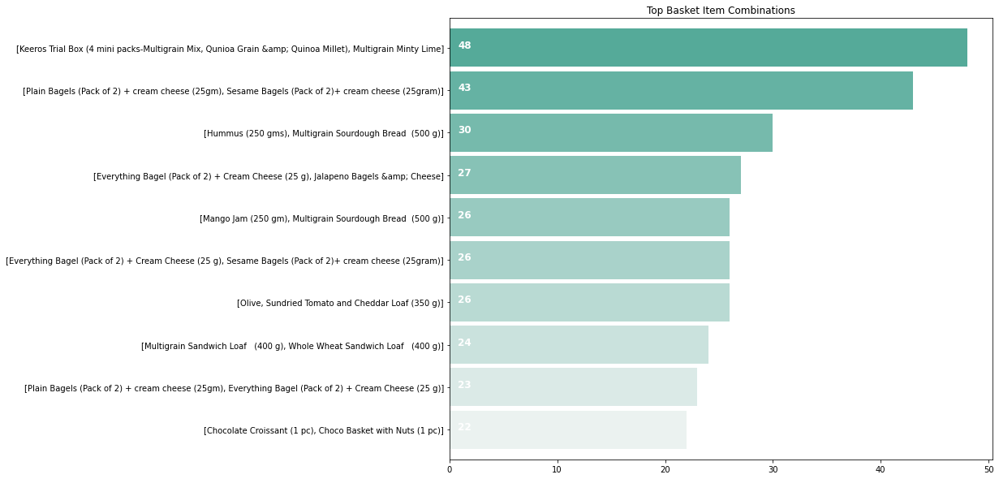

In [30]:
#finding the top 10 most bought basket combinations
import matplotlib.pyplot as plt
import seaborn as sns

plt.subplots(figsize=(12,10))
list1 = []
for i in range(len(df)):
    if len(df['ORDER_ITEMS'][i])>1:
        list1.append(df['ORDER_ITEMS'][i])
ax = pd.Series(list1).value_counts()[:10].sort_values(ascending=True).plot.barh(width=0.9,color=sns.color_palette("light:#5A9",10))
for i, v in enumerate(pd.Series(list1).value_counts()[:10].sort_values(ascending=True).values): 
    ax.text(.8, i, v,fontsize=12,color='white',weight='bold')
plt.title('Top Basket Item Combinations')
plt.show()

In [65]:
conda list matplotlib

# packages in environment at D:\ANACONDA:
#
# Name                    Version                   Build  Channel
matplotlib                3.3.4                    pypi_0    pypi

Note: you may need to restart the kernel to use updated packages.


In [32]:
pip install matplotlib --force-reinstall --user

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
conda-repo-cli 1.0.4 requires pathlib, which is not installed.


In [31]:
#dropping rows that contain null values for item_categories
df=df.dropna(subset=['ITEM_CATEGORIES'])


In [32]:
df.drop(['level_0','index'],axis='columns',inplace=True)
df=df.reset_index()

In [33]:
df.head()

,index,ORDER_ID,CUSTOMER_ID,BREAD_SUBSCRIBER,MILK_SUBSCRIBER,STATE,ORDER_ITEMS,ITEM_CATEGORIES,VENDOR_ATTRIBUTE
0,0,31624,4157,1,1,UP,"[Parwal (500g), Soft Pear/ Babbugosha (500g), ...",[Fruits &amp; Veggies],"Desi Utpad by Jaya,Kyssa Farms"
1,1,6200,71,1,1,DL,"[Gruyere Cheese (200 gm), Amaranth Bread (Glut...","[Dairy, Freshly Baked, Spreads &amp; Sauces, S...",Organic German Bake Shop
2,2,8523,532,1,1,DL,"[Feta Cheese Kodai (200 gm), Rye Ragi Bread (5...","[Dairy, Freshly Baked]",Organic German Bake Shop
3,3,35912,4667,1,1,DL,"[Onion Jam (210 gm), Miche Whole Wheat Sourdou...","[Freshly Baked, Spreads &amp; Sauces, Freshly ...",Miche Artisanal Bakery
4,4,8558,27,1,1,HR,"[Onion Jam (210 gm), Himalayan Montasio Cheese...","[Spreads &amp; Sauces, Freshly Baked, Dairy, D...",Miche Artisanal Bakery


In [34]:
#Removing the duplicate values inside the item category list 
for i in range(len(df)):
    df['ITEM_CATEGORIES'][i]=list(set(df['ITEM_CATEGORIES'][i]))

<ipython-input-34-7935e27c5ac2>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ITEM_CATEGORIES'][i]=list(set(df['ITEM_CATEGORIES'][i]))


In [35]:
df.drop(['index'],axis='columns',inplace=True)

In [36]:
df.head()

,ORDER_ID,CUSTOMER_ID,BREAD_SUBSCRIBER,MILK_SUBSCRIBER,STATE,ORDER_ITEMS,ITEM_CATEGORIES,VENDOR_ATTRIBUTE
0,31624,4157,1,1,UP,"[Parwal (500g), Soft Pear/ Babbugosha (500g), ...",[Fruits &amp; Veggies],"Desi Utpad by Jaya,Kyssa Farms"
1,6200,71,1,1,DL,"[Gruyere Cheese (200 gm), Amaranth Bread (Glut...","[Dairy, Snacks &amp; Beverages, Spreads &amp; ...",Organic German Bake Shop
2,8523,532,1,1,DL,"[Feta Cheese Kodai (200 gm), Rye Ragi Bread (5...","[Dairy, Freshly Baked]",Organic German Bake Shop
3,35912,4667,1,1,DL,"[Onion Jam (210 gm), Miche Whole Wheat Sourdou...","[Spreads &amp; Sauces, Freshly Baked]",Miche Artisanal Bakery
4,8558,27,1,1,HR,"[Onion Jam (210 gm), Himalayan Montasio Cheese...","[Dairy, Spreads &amp; Sauces, Freshly Baked]",Miche Artisanal Bakery


In [37]:
#refining the text values for categories for better understanding
for i in range(len(df)):
    #print(df['ITEM_CATEGORIES'][i])
    for j in range(len(df['ITEM_CATEGORIES'][i])):
        if df['ITEM_CATEGORIES'][i][j]=='Fruits &amp; Veggies':
            df['ITEM_CATEGORIES'][i][j]='Fruits and Veggies'

In [38]:
for i in range(len(df)):
    #print(df['ITEM_CATEGORIES'][i])
    for j in range(len(df['ITEM_CATEGORIES'][i])):
        if df['ITEM_CATEGORIES'][i][j]=='Spreads &amp; Sauces':
            df['ITEM_CATEGORIES'][i][j]='Spreads and Sauces'

In [39]:
for i in range(len(df)):
    #print(df['ITEM_CATEGORIES'][i])
    for j in range(len(df['ITEM_CATEGORIES'][i])):
        if df['ITEM_CATEGORIES'][i][j]=='Snacks &amp; Beverages':
            df['ITEM_CATEGORIES'][i][j]='Snacks and Beverages'

In [40]:

df['ITEM_CATEGORIES'].value_counts()

TypeError: unhashable type: 'list'

Exception ignored in: 'pandas._libs.index.IndexEngine._call_map_locations'
Traceback (most recent call last):
  File "pandas\_libs\hashtable_class_helper.pxi", line 4588, in pandas._libs.hashtable.PyObjectHashTable.map_locations
TypeError: unhashable type: 'list'


[Freshly Baked]                                                      6219
[Fruits and Veggies]                                                 5268
[Dairy]                                                              1884
[Dairy, Freshly Baked]                                               1078
[Spreads and Sauces, Freshly Baked]                                   978
[Spreads and Sauces]                                                  613
[Snacks and Beverages]                                                445
[Indian Grocery]                                                      401
[Snacks and Beverages, Freshly Baked]                                 242
[Dairy, Spreads and Sauces, Freshly Baked]                            165
[Snacks and Beverages, Spreads and Sauces, Freshly Baked]             133
[Snacks and Beverages, Spreads and Sauces]                            121
[Indian Grocery, Fruits and Veggies]                                  111
[Dairy, Indian Grocery]               

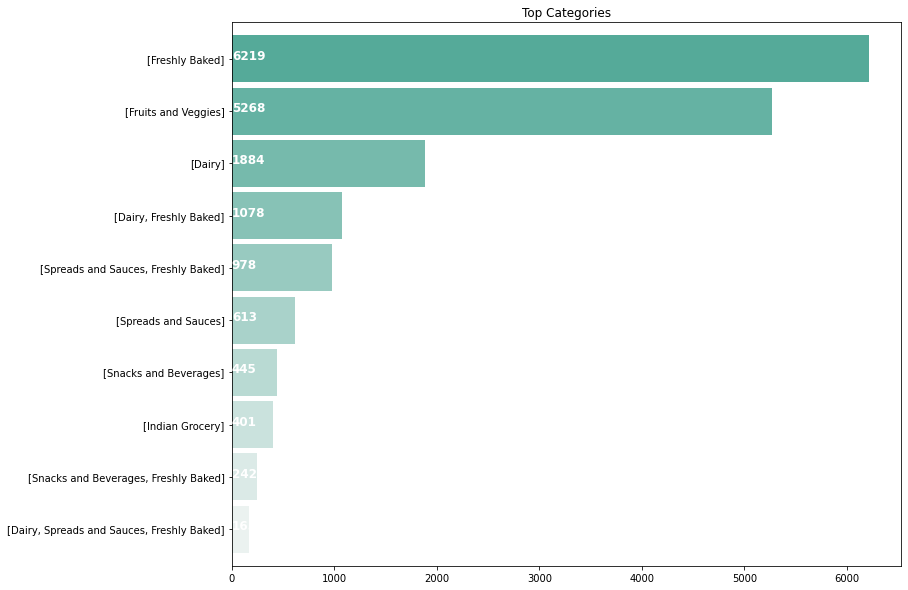

In [41]:
#finding the top 10 most bought category combinations

plt.subplots(figsize=(12,10))
list1 = []
for i in df['ITEM_CATEGORIES']:
    list1.append(i)
ax = pd.Series(list1).value_counts()[:10].sort_values(ascending=True).plot.barh(width=0.9,color=sns.color_palette("light:#5A9",10))
for i, v in enumerate(pd.Series(list1).value_counts()[:10].sort_values(ascending=True).values): 
    ax.text(.8, i, v,fontsize=12,color='white',weight='bold')
plt.title('Top Categories')
plt.show()

In [42]:
df.head()

,ORDER_ID,CUSTOMER_ID,BREAD_SUBSCRIBER,MILK_SUBSCRIBER,STATE,ORDER_ITEMS,ITEM_CATEGORIES,VENDOR_ATTRIBUTE
0,31624,4157,1,1,UP,"[Parwal (500g), Soft Pear/ Babbugosha (500g), ...",[Fruits and Veggies],"Desi Utpad by Jaya,Kyssa Farms"
1,6200,71,1,1,DL,"[Gruyere Cheese (200 gm), Amaranth Bread (Glut...","[Dairy, Snacks and Beverages, Spreads and Sauc...",Organic German Bake Shop
2,8523,532,1,1,DL,"[Feta Cheese Kodai (200 gm), Rye Ragi Bread (5...","[Dairy, Freshly Baked]",Organic German Bake Shop
3,35912,4667,1,1,DL,"[Onion Jam (210 gm), Miche Whole Wheat Sourdou...","[Spreads and Sauces, Freshly Baked]",Miche Artisanal Bakery
4,8558,27,1,1,HR,"[Onion Jam (210 gm), Himalayan Montasio Cheese...","[Dairy, Spreads and Sauces, Freshly Baked]",Miche Artisanal Bakery


In [43]:
#Converting values of the column to string for further conversion to list
df['VENDOR_ATTRIBUTE']=df['VENDOR_ATTRIBUTE'].astype(str)

In [44]:
#converting into lists
for i in range(len(df)):
    df['VENDOR_ATTRIBUTE'][i]=df['VENDOR_ATTRIBUTE'][i].split(',')

<ipython-input-44-6772414859f6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['VENDOR_ATTRIBUTE'][i]=df['VENDOR_ATTRIBUTE'][i].split(',')


In [45]:
#replacing the null values with known vendor values
for i in range(len(df)):
    if df['VENDOR_ATTRIBUTE'][i]==['nan']:
        #print(df['ITEM_CATEGORIES'][i])
        for j in range(len(df['ITEM_CATEGORIES'][i])):
            #print(df['ORDER_ITEMS'][i][j].split())
            if (df['ITEM_CATEGORIES'][i][j])=='Fruits and Veggies':
                df['VENDOR_ATTRIBUTE'][i]=['Kyssa Farms']
    else:
        #print(df['ITEM_CATEGORIES'][i])
        for j in range(len(df['ITEM_CATEGORIES'][i])):
            #print(df['ORDER_ITEMS'][i][j].split())
            if (df['ITEM_CATEGORIES'][i][j])=='Fruits and Veggies':
                for k in range(len(df['VENDOR_ATTRIBUTE'][i])):
                    if df['VENDOR_ATTRIBUTE'][i][k]!='Kyssa Farms':
                        df['VENDOR_ATTRIBUTE'][i].append('Kyssa Farms')

<ipython-input-45-6cad6467e1fa>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['VENDOR_ATTRIBUTE'][i]=['Kyssa Farms']


In [46]:
for i in range(len(df)):
    if df['VENDOR_ATTRIBUTE'][i]==['nan']:
        #print(df['ITEM_CATEGORIES'][i])
        for j in range(len(df['ITEM_CATEGORIES'][i])):
            #print(df['ORDER_ITEMS'][i][j].split())
            if (df['ITEM_CATEGORIES'][i][j])=='Dairy':
                df['VENDOR_ATTRIBUTE'][i]=['Mr. Dairy']
    else:
        #print(df['ITEM_CATEGORIES'][i])
        for j in range(len(df['ITEM_CATEGORIES'][i])):
            #print(df['ORDER_ITEMS'][i][j].split())
            if (df['ITEM_CATEGORIES'][i][j])=='Dairy':
                for k in range(len(df['VENDOR_ATTRIBUTE'][i])):
                    if df['VENDOR_ATTRIBUTE'][i][k]!='Mr. Dairy':
                        df['VENDOR_ATTRIBUTE'][i].append('Mr. Dairy')

<ipython-input-46-7c17511d950b>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['VENDOR_ATTRIBUTE'][i]=['Mr. Dairy']


In [47]:
B=['Jowar & Ragi bread (700 g)','Jowar & Ragi Gluten-free bread (700 g)','Everything Bagel (Pack of 2)','Sourdough Sandwich Loaf Bread  (650g)','Miche Whole Wheat (550g)']
for i in range(len(df)):
    if type(df['VENDOR_ATTRIBUTE'][i])==float:
        #print(df['ITEM_CATEGORIES'][i])
        for j in range(len(df['ORDER_ITEMS'][i])):
            #print(df['ORDER_ITEMS'][i][j].split())
            if (df['ORDER_ITEMS'][i][j])=='Jowar & Ragi Gluten-free bread (700 g)':
                df['VENDOR_ATTRIBUTE'][i]=['Miche Artisanal Bakery']
                
for i in range(len(df)):
    if type(df['VENDOR_ATTRIBUTE'][i])==float:
        #print(df['ITEM_CATEGORIES'][i])
        for j in range(len(df['ORDER_ITEMS'][i])):
            #print(df['ORDER_ITEMS'][i][j].split())
            if (df['ORDER_ITEMS'][i][j])=='Jowar & Ragi bread (700 g)':
                df['VENDOR_ATTRIBUTE'][i]=['Miche Artisanal Bakery']
                
for i in range(len(df)):
    if type(df['VENDOR_ATTRIBUTE'][i])==float:
        #print(df['ITEM_CATEGORIES'][i])
        for j in range(len(df['ORDER_ITEMS'][i])):
            #print(df['ORDER_ITEMS'][i][j].split())
            if (df['ORDER_ITEMS'][i][j])=='Sourdough Sandwich Loaf Bread  (650g)':
                df['VENDOR_ATTRIBUTE'][i]=['Miche Artisanal Bakery']

In [48]:
for i in range(len(df)):
    if type(df['VENDOR_ATTRIBUTE'][i])==float:
        #print(df['ITEM_CATEGORIES'][i])
        for j in range(len(df['ORDER_ITEMS'][i])):
            #print(df['ORDER_ITEMS'][i][j].split())
            if (df['ORDER_ITEMS'][i][j])=='Everything Bagel (Pack of 2)':
                df['VENDOR_ATTRIBUTE'][i]=['Miche Artisanal Bakery']

for i in range(len(df)):
    if type(df['VENDOR_ATTRIBUTE'][i])==float:
        #print(df['ITEM_CATEGORIES'][i])
        for j in range(len(df['ORDER_ITEMS'][i])):
            #print(df['ORDER_ITEMS'][i][j].split())
            if (df['ORDER_ITEMS'][i][j])=='Miche Whole Wheat (550g)':
                df['VENDOR_ATTRIBUTE'][i]=['Miche Artisanal Bakery']
                

In [49]:
for i in range(len(df)):
    df['VENDOR_ATTRIBUTE'][i]=list(set(df['VENDOR_ATTRIBUTE'][i]))

<ipython-input-49-80afb05ec491>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['VENDOR_ATTRIBUTE'][i]=list(set(df['VENDOR_ATTRIBUTE'][i]))


In [50]:
n=" "
for i in range(len(df)):
    if df['VENDOR_ATTRIBUTE'][i]==['nan']:
        #print(df['ITEM_CATEGORIES'][i])
        df['VENDOR_ATTRIBUTE'][i]=n.join(df['VENDOR_ATTRIBUTE'][i])
        df['VENDOR_ATTRIBUTE']=df['VENDOR_ATTRIBUTE'].replace(df['VENDOR_ATTRIBUTE'][i],np.nan)
        

<ipython-input-50-daf5f0f7c9a7>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['VENDOR_ATTRIBUTE'][i]=n.join(df['VENDOR_ATTRIBUTE'][i])


In [51]:
df.isna().sum()

ORDER_ID               0
CUSTOMER_ID            0
BREAD_SUBSCRIBER       0
MILK_SUBSCRIBER        0
STATE                  0
ORDER_ITEMS            0
ITEM_CATEGORIES        0
VENDOR_ATTRIBUTE    1729
dtype: int64

In [53]:
df=df.reset_index()


In [52]:
#dropping rows that contain null values for item_categories
df=df.dropna(subset=['VENDOR_ATTRIBUTE'])


In [54]:
df.head()

,index,ORDER_ID,CUSTOMER_ID,BREAD_SUBSCRIBER,MILK_SUBSCRIBER,STATE,ORDER_ITEMS,ITEM_CATEGORIES,VENDOR_ATTRIBUTE
0,0,31624,4157,1,1,UP,"[Parwal (500g), Soft Pear/ Babbugosha (500g), ...",[Fruits and Veggies],"[Kyssa Farms, Desi Utpad by Jaya]"
1,1,6200,71,1,1,DL,"[Gruyere Cheese (200 gm), Amaranth Bread (Glut...","[Dairy, Snacks and Beverages, Spreads and Sauc...","[Organic German Bake Shop, Mr. Dairy]"
2,2,8523,532,1,1,DL,"[Feta Cheese Kodai (200 gm), Rye Ragi Bread (5...","[Dairy, Freshly Baked]","[Organic German Bake Shop, Mr. Dairy]"
3,3,35912,4667,1,1,DL,"[Onion Jam (210 gm), Miche Whole Wheat Sourdou...","[Spreads and Sauces, Freshly Baked]",[Miche Artisanal Bakery]
4,4,8558,27,1,1,HR,"[Onion Jam (210 gm), Himalayan Montasio Cheese...","[Dairy, Spreads and Sauces, Freshly Baked]","[Mr. Dairy, Miche Artisanal Bakery]"


In [91]:
df.drop(['index','level_0'],axis='columns',inplace=True)


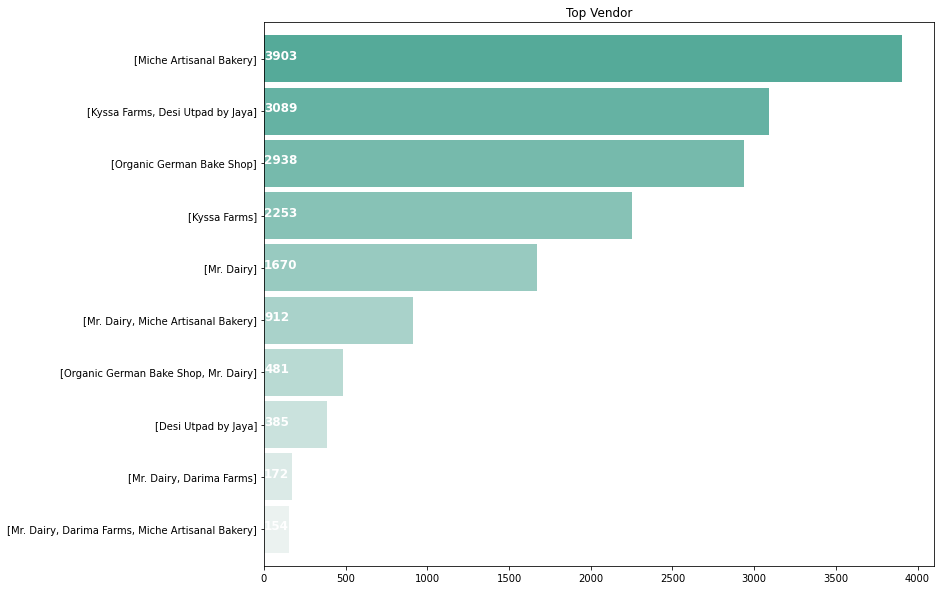

In [55]:
#finding the top 10 most bought vendor combinations
plt.subplots(figsize=(12,10))
list1 = []
for i in df['VENDOR_ATTRIBUTE']:
    list1.append(i)
ax = pd.Series(list1).value_counts()[:10].sort_values(ascending=True).plot.barh(width=0.9,color=sns.color_palette("light:#5A9",10))
for i, v in enumerate(pd.Series(list1).value_counts()[:10].sort_values(ascending=True).values): 
    ax.text(.8, i, v,fontsize=12,color='white',weight='bold')
plt.title('Top Vendor')
plt.show()

In [94]:
!pip install apyori

In [56]:
from mlxtend.frequent_patterns import apriori, association_rules

In [57]:
from mlxtend.preprocessing import TransactionEncoder
encoder = TransactionEncoder()
transactions = pd.DataFrame(encoder.fit(df['ORDER_ITEMS']).transform(df['ORDER_ITEMS']), columns=encoder.columns_)
display(transactions.head())

,13 Herbs Mix Tea (100 gms),16 grain atta (1kg),5 Corn Bun (5 Corn Bun),55% Dark Chocolate- Single Origin cacao from Tamil Nadu,55% Dark Tamil Nadu Cacao (65 g),63% Dark Chocolate with Orange,65% Dark Chocolate with Coffee,65% Dark with Coffee (65 g),65% Darkins Dark Artisanal Chocolate with Coorg Coffee,70% Dark Andhra Cacao (65 g),...,clove (100gm),lobia (500gm),mix millets (1kg),sella 1121-(1 kg),sem phali (500gm),utilissimus (kakri) 500g,utilissimus / kakri 500g,whole-wheat-pizza-base (1kg),whole-wheat-pizza-dough (1kg),yam/elephant foot (500 gm)
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [58]:
#Using Apriori Algorithm on our dataset and storing values for the association rules received
frequent_itemsets = apriori(transactions, min_support=0.01,use_colnames=True)
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1)
rules[1740:1760]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
1740,(Coriander leaves (250 g)),"(Onion (500 gm), Potato (500gm), Tomato - Desi...",0.063858,0.026846,0.010775,0.168732,6.285176,0.009061,1.170686
1741,(Tomato - Desi (500 gm)),"(Onion (500 gm), Potato (500gm), Coriander lea...",0.091496,0.015341,0.010775,0.117764,7.676655,0.009371,1.116096
1742,"(Onion (500 gm), Potato (500gm), Ginger (250 gm))",(Tomato - Desi (500 gm)),0.017167,0.091496,0.012845,0.748227,8.177727,0.011274,3.608425
1743,"(Onion (500 gm), Tomato - Desi (500 gm), Ginge...",(Potato (500gm)),0.017349,0.068180,0.012845,0.740351,10.858700,0.011662,3.588765
1744,"(Potato (500gm), Tomato - Desi (500 gm), Ginge...",(Onion (500 gm)),0.016741,0.065258,0.012845,0.767273,11.757453,0.011752,4.016468
1745,"(Onion (500 gm), Potato (500gm), Tomato - Desi...",(Ginger (250 gm)),0.026846,0.058379,0.012845,0.478458,8.195652,0.011277,1.805455
1746,"(Onion (500 gm), Ginger (250 gm))","(Potato (500gm), Tomato - Desi (500 gm))",0.025872,0.039995,0.012845,0.496471,12.413276,0.011810,1.906552
1747,"(Potato (500gm), Ginger (250 gm))","(Onion (500 gm), Tomato - Desi (500 gm))",0.024168,0.039934,0.012845,0.531486,13.309029,0.011880,2.049173
1748,"(Tomato - Desi (500 gm), Ginger (250 gm))","(Onion (500 gm), Potato (500gm))",0.032081,0.039934,0.012845,0.400380,10.025967,0.011564,1.601122
1749,"(Onion (500 gm), Potato (500gm))","(Tomato - Desi (500 gm), Ginger (250 gm))",0.039934,0.032081,0.012845,0.321646,10.025967,0.011564,1.426864


Text(0.5, 1.0, 'Support values and their frequencies')

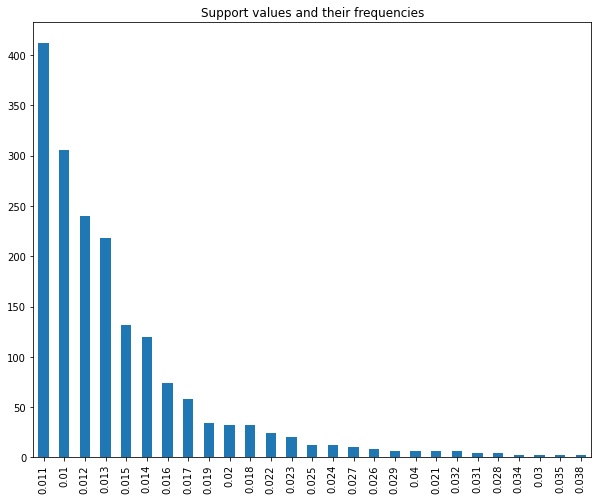

In [59]:
#plotting the count of each support values to understand distribution of support values
top_support = round(rules['support'],3).value_counts()
top_support.plot(kind='bar',figsize=(10,8))
plt.title('Support values and their frequencies')

In [60]:
frequent_itemsets 

,support,itemsets
0,0.011201,(A2 Ghee - 500ml)
1,0.015767,(A2 Milk (Whole) (1 Litre))
2,0.010836,(A2 Skimmed Milk Trial - 1 litre)
3,0.011201,(Amaranth - Chaulai - Green (500 GM))
4,0.012966,(Amla (500 gm))
...,...,...
578,0.011445,"(Onion (500 gm), Potato (500gm), Tomato - Desi..."
579,0.010775,"(Onion (500 gm), Potato (500gm), Coriander lea..."
580,0.012845,"(Ginger (250 gm), Onion (500 gm), Potato (500g..."
581,0.013393,"(Onion (500 gm), Potato (500gm), Tomato - Desi..."


<AxesSubplot:xlabel='support', ylabel='confidence'>

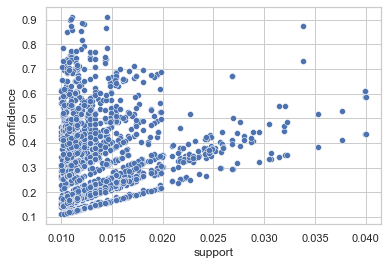

In [61]:
import seaborn as sns
 
sns.set(style='whitegrid')
sns.scatterplot(x=rules['support'], y=rules['confidence'])

<AxesSubplot:xlabel='lift', ylabel='confidence'>

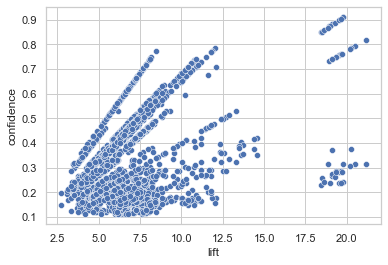

In [62]:
sns.set(style='whitegrid') 
sns.scatterplot(x=rules['lift'], y=rules['confidence'])

In [63]:
from apyori import apriori

In [64]:
association_rules = apriori(df['ORDER_ITEMS'], min_support=0.01, min_confidence=0.2, min_lift=3, min_length=2)

In [65]:
#association_rules = apriori(df['ITEM_CATEGORIES'])

In [66]:
association_results = list(association_rules)

In [67]:
df.shape

(16427, 9)

In [68]:
for item in association_results:

    # first index of the inner list
    # Contains base item and add item
    pair = item[0] 
    items = [x for x in pair]
    print("Rule: " + items[0] + " -> " + items[1])

    #second index of the inner list
    print("Support: " + str(item[1]))

    #third index of the list located at 0th
    #of the third index of the inner list

    print("Confidence: " + str(item[2][0][2]))
    print("Lift: " + str(item[2][0][3]))
    print("=====================================")



Rule: Banana - 6 pcs -> Beetroot (500 gm)
Support: 0.01302733304924819
Confidence: 0.32228915662650603
Lift: 3.7547829616337696
Rule: Banana - 6 pcs -> Bell Peppers - Red (250gm)
Support: 0.015401473184391551
Confidence: 0.33421400264200796
Lift: 3.8937116463831667
Rule: Banana - 6 pcs -> Bell Peppers - Yellow (250gm)
Support: 0.013879588482376574
Confidence: 0.3584905660377358
Lift: 4.176542218653821
Rule: Banana - 6 pcs -> Bitter Gourd (500 gm)
Support: 0.01302733304924819
Confidence: 0.39194139194139194
Lift: 4.566256202426415
Rule: Banana - 6 pcs -> Bottlegourd  (500 gm)
Support: 0.02575028915809338
Confidence: 0.3
Lift: 4.2120512820512825
Rule: Banana - 6 pcs -> Brinjal - Big (500gm)
Support: 0.011627199123394412
Confidence: 0.31833333333333336
Lift: 3.7086962174940905
Rule: Cabbage - Green (500gm) -> Banana - 6 pcs
Support: 0.012418579168442198
Confidence: 0.33497536945812806
Lift: 3.9025818397791987
Rule: Banana - 6 pcs -> Capsicum - Green (500 gm)
Support: 0.01978450112619468
C

In [69]:
# new df from the column of lists
store_data = pd.DataFrame(df['ORDER_ITEMS'].tolist())
# display the resulting df
store_data

,0,1,2,3,4,5,6,7,8,9,...,47,48,49,50,51,52,53,54,55,56
0,Parwal (500g),Soft Pear/ Babbugosha (500g),Onion (500 gm),Banana - 6 pcs,Lemon (250 gm),Potato (500gm),None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1,Gruyere Cheese (200 gm),Amaranth Bread (Gluten free &amp; Vegan) (1 lo...,Cashew Cookies (350 gm),Cashew Butter (200 gm),None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
2,Feta Cheese Kodai (200 gm),Rye Ragi Bread (500 g),Gouda Cheese Kodai (200 gm),None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
3,Onion Jam (210 gm),Miche Whole Wheat Sourdough Bread (550g),None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
4,Onion Jam (210 gm),Himalayan Montasio Cheese (200 g),Whole Wheat Burger Buns (pack of 4),Sundried Tomato Pesto (210gm),None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16422,Zucchini - Yellow ( 250 gms ),Taro Root - Arbi ( 500GM),Lady Finger / Bhindi (500 gm),Parwal (500g),Onion (500 gm),Tomato - Desi (500 gm),Bottlegourd (500 gm),Garlic (250 gm),Lemon (250 gm),Cucumber - Desi (500gm),...,None,None,None,None,None,None,None,None,None,None
16423,Miche Whole Wheat (550g),Sesame Bagels (Pack of 2)+ cream cheese (25gram),None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
16424,Radish - Red (500g),Jackfruit (500g),Brinjal - Big (500gm),Spinach (500gm),Sweet Potato (500 gm),Pumpkin - Green (2 Kg),Guava (500 gm),None,None,None,...,None,None,None,None,None,None,None,None,None,None
16425,Ginger (250 gm),Cabbage - Green (500gm),Carrot - Orange (500 gm),Cucumber (500gm),Tinda (500GM),Lemon (250 gm),French Beans (500 gm),None,None,None,...,None,None,None,None,None,None,None,None,None,None


In [70]:
df_shape = store_data.shape
n_of_transactions = df_shape[0]
n_of_products = df_shape[1]
# Converting our dataframe into a list of lists for Apriori algorithm
records = []
for i in range(0, n_of_transactions):
    records.append([])
    for j in range(0, n_of_products):
        if (str(store_data.values[i,j]) != 'None'):
            records[i].append(str(store_data.values[i,j]))
        else :
            continue

In [71]:
association_rules = apriori(records, min_support=0.0025, min_confidence=0.1, min_lift=1, max_length=5)
association_results = list(association_rules)

In [72]:
# First index of the inner list contains base item and add item
for item in association_results:

    # first index of the inner list
    # Contains base item and add item
    pair = item[0] 
    items = [x for x in pair]
    print("Rule: " + items[0] + " -> " + items[1])

    #second index of the inner list
    print("Support: " + str(item[1]))

    #third index of the list located at 0th
    #of the third index of the inner list

    print("Confidence: " + str(item[2][0][2]))
    print("Lift: " + str(item[2][0][3]))
    print("=====================================")


Rule: Banana - 6 pcs -> Amaranth - Chaulai - Green (500 GM)
Support: 0.004443903329883728
Confidence: 0.3967391304347826
Lift: 4.622151557200123
Rule: Bottlegourd  (500 gm) -> Amaranth - Chaulai - Green (500 GM)
Support: 0.003409021732513545
Confidence: 0.30434782608695654
Lift: 4.273095503530286
Rule: Capsicum - Green (500 gm) -> Amaranth - Chaulai - Green (500 GM)
Support: 0.0025567662993851584
Confidence: 0.22826086956521738
Lift: 3.9932282261425196
Rule: Amaranth - Chaulai - Green (500 GM) -> Cauliflower (500 gm)
Support: 0.0025567662993851584
Confidence: 0.22826086956521738
Lift: 3.449532018719251
Rule: Coriander leaves (250 g) -> Amaranth - Chaulai - Green (500 GM)
Support: 0.0027393924636269556
Confidence: 0.24456521739130435
Lift: 3.829812036307871
Rule: Amaranth - Chaulai - Green (500 GM) -> Cucumber - Desi (500gm)
Support: 0.0027393924636269556
Confidence: 0.24456521739130435
Lift: 4.5549578527063
Rule: Amaranth - Chaulai - Green (500 GM) -> Lady Finger / Bhindi (500 gm)
Supp

In [73]:
# Get all the products listed in dataset

# First merge all the columns of the data frame to a data series object

merged = store_data[0]

for i in range(1,n_of_products):

    merged = merged.append(store_data[i])

# Then rank all the unique products

ranking = merged.value_counts(ascending=False)

# Extract the products in order without their respective count

ranked_products = list(ranking.index)

In [74]:
lookup_table = {}

for item in association_results:

    # First index of the inner list contains base item and add item

    pair = item[0] 

    items = [x for x in pair]

    to_print = "Rule: "

    arrow = " -> "

    for i in range(len(items)):

        to_print += str(items[i]) + arrow        

    # If we do not have 3 recommendations for our base product we will

    # suggest top ranked products in addition

    if len(items) < 5:

        items_to_append = items

        i = 0


    # Add the items to db, with base product separately from the products 

    # that are to be recommended

    lookup_table[items_to_append[0]] = items_to_append[1:]

    print(to_print)

    # Print the support for this association rule

    print("Support: " + str(item[1]))

    # Print the confidence and lift for this association rule

    print("Confidence: " + str(item[2][0][2]))

    print("Lift: " + str(item[2][0][3]))

    print("=====================================")

Rule: Banana - 6 pcs -> Amaranth - Chaulai - Green (500 GM) -> 
Support: 0.004443903329883728
Confidence: 0.3967391304347826
Lift: 4.622151557200123
Rule: Bottlegourd  (500 gm) -> Amaranth - Chaulai - Green (500 GM) -> 
Support: 0.003409021732513545
Confidence: 0.30434782608695654
Lift: 4.273095503530286
Rule: Capsicum - Green (500 gm) -> Amaranth - Chaulai - Green (500 GM) -> 
Support: 0.0025567662993851584
Confidence: 0.22826086956521738
Lift: 3.9932282261425196
Rule: Amaranth - Chaulai - Green (500 GM) -> Cauliflower (500 gm) -> 
Support: 0.0025567662993851584
Confidence: 0.22826086956521738
Lift: 3.449532018719251
Rule: Coriander leaves (250 g) -> Amaranth - Chaulai - Green (500 GM) -> 
Support: 0.0027393924636269556
Confidence: 0.24456521739130435
Lift: 3.829812036307871
Rule: Amaranth - Chaulai - Green (500 GM) -> Cucumber - Desi (500gm) -> 
Support: 0.0027393924636269556
Confidence: 0.24456521739130435
Lift: 4.5549578527063
Rule: Amaranth - Chaulai - Green (500 GM) -> Lady Finge

In [131]:
ranked_products

['Tomato - Desi (500 gm)',
 'Banana - 6 pcs',
 'Bottlegourd  (500 gm)',
 'Lady Finger / Bhindi (500 gm)',
 'Potato (500gm)',
 'Lemon (250 gm)',
 'Cauliflower (500 gm)',
 'Onion (500 gm)',
 'Coriander leaves (250 g)',
 'Papaya ( 1Kg)',
 'Red Apple (500 gm)',
 'Ginger (250 gm)',
 'Capsicum - Green (500 gm)',
 'Spinach (500gm)',
 'Cucumber - Desi (500gm)',
 'Pomegranate (500 gm)',
 'Multigrain Sourdough Bread  (500 g)',
 'Mushroom - 200 gms pkt',
 'Bell Peppers - Red (250gm)',
 'Multigrain Sandwich Loaf   (400 g)',
 'French Beans (500 gm)',
 'Sesame Bagels (Pack of 2)+ cream cheese (25gram)',
 'Beetroot (500 gm)',
 'Bell Peppers - Yellow (250gm)',
 'Everything Bagel (Pack of 2) + Cream Cheese (25 g)',
 'Cabbage - Green (500gm)',
 'Cucumber - Seedless (500 gm )',
 'Brinjal - Big (500gm)',
 'Green Peas - Matar (500 gm)',
 'Bitter Gourd (500 gm)',
 'Chilli - Green (250 gm)',
 'Broccoli (400 gms)',
 'Garlic (250 gm)',
 'Carrot - Red (500g)',
 'Spring Onion (500 gm)',
 'Zucchini - Green  (250 

In [75]:
lookup_table

{'Banana - 6 pcs': ['Red Apple (500 gm)',
  'Spinach (500gm)',
  'Tomato - Desi (500 gm)'],
 'Bottlegourd  (500 gm)': ['Red Apple (500 gm)',
  'Spinach (500gm)',
  'Tomato - Desi (500 gm)'],
 'Capsicum - Green (500 gm)': ['Pomegranate (500 gm)',
  'Tomato - Desi (500 gm)',
  'Papaya ( 1Kg)'],
 'Amaranth - Chaulai - Green (500 GM)': ['Papaya ( 1Kg)'],
 'Coriander leaves (250 g)': ['Bell Peppers - Red (250gm)',
  'Bell Peppers - Yellow (250gm)',
  'Broccoli (400 gms)'],
 'Potato (500gm)': ['Red Apple (500 gm)',
  'Spinach (500gm)',
  'Tomato - Desi (500 gm)'],
 'Spinach (500gm)': ['Lemon (250 gm)',
  'Ginger (250 gm)',
  'Lady Finger / Bhindi (500 gm)'],
 'Tomato - Desi (500 gm)': ['Red Apple (500 gm)',
  'Lemon (250 gm)',
  'Spinach (500gm)'],
 'Amla (500 gm)': ['Bottlegourd  (500 gm)', 'Tomato - Desi (500 gm)'],
 'Beetroot (500 gm)': ['Tomato - Desi (500 gm)',
  'Lemon (250 gm)',
  'Spinach (500gm)'],
 'Bell Peppers - Red (250gm)': ['Lemon (250 gm)',
  'Tomato - Desi (500 gm)',
  'Pome

In [135]:
lookup_table['default_recommendation'] = ranked_products[15:20]

In [150]:
#apriori based recommendations
def ap1(product):
    try:
        list1=lookup_table[product]
        return list1
    except:
        return None

def ap2():
    list2=lookup_table['default_recommendation']
    return list2
        

In [151]:
ap1('Wheat Bansi atta (1 kg)')

In [178]:
#Function for converting the item list to binary bin
def binary(item_list):
    binaryList = []
    
    for item in prod:
        if item in item_list:
            binaryList.append(1)
        else:
            binaryList.append(0)
    
    return binaryList

In [80]:
#Getting a list of unique products
prod=[]
for i in range(len(df)):
    for j in range(len(df['ORDER_ITEMS'][i])):
        prod.append(df['ORDER_ITEMS'][i][j])
        
prod=set(prod)
prod=list(prod)
prod


['Fenugreek Leaves - Methi (500GM)',
 'Ginger Powder (250g)',
 'Multigrain Whole Kamut Bread (500 gm)',
 'Pahadi Rajma - Small (1 Kg)',
 'Lettuce - Green (250gm)',
 'Bell pepper (250 gm)',
 'Watermelon (1kg)',
 'Kulath / Horse gram (1 kg)',
 'Gobhi Gajar Shalgam Khata Meetha pickle (200g-225g)',
 'Ash Gourd (White Pumpkin) (2 kg)',
 'Papaya ( 1Kg)',
 'Parsley (250gm)',
 'Potato (500gm)',
 'Miche Whole Wheat (550 g)',
 'Deli Style Rye Bread (500g)',
 'Cheddar Cheese Kodai (200 gm)',
 'Wood-Pressed Yellow Mustard Oil (500 ml)',
 'Whole Walnuts (1 kg)',
 'Mozzarella - Manali (250 g)',
 '55% Dark Chocolate- Single Origin cacao from Tamil Nadu',
 'Gram flour (Besan) (500 gm)',
 'Herbal Gulaal Gift Pack of 5(100 gms each - assorted colors)',
 'Basil (150g)',
 'Brinjal - Small (500 gm)',
 'Edam Cheese (200 gm )',
 'Emmenthal Cheese Kodai (200 gm)',
 'Pahadi Aloo / Potato (1 kg)',
 'Watermelon (2 kg)',
 'Everything Bagel (Pack of 2) + Cream Cheese (25 g)',
 'Lal mirch - Whole (250 gm)',
 'Pudi

In [81]:
df['order_items_bin']= df['ORDER_ITEMS'].apply(lambda x: binary(x))
df['order_items_bin'].head(190)

0      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, ...
1      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
2      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
3      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
4      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
                             ...                        
185    [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, ...
186    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
187    [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, ...
188    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
189    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
Name: order_items_bin, Length: 190, dtype: object

In [82]:
df.head(3)

,index,ORDER_ID,CUSTOMER_ID,BREAD_SUBSCRIBER,MILK_SUBSCRIBER,STATE,ORDER_ITEMS,ITEM_CATEGORIES,VENDOR_ATTRIBUTE,order_items_bin
0,0,31624,4157,1,1,UP,"[Parwal (500g), Soft Pear/ Babbugosha (500g), ...",[Fruits and Veggies],"[Kyssa Farms, Desi Utpad by Jaya]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, ..."
1,1,6200,71,1,1,DL,"[Gruyere Cheese (200 gm), Amaranth Bread (Glut...","[Dairy, Snacks and Beverages, Spreads and Sauc...","[Organic German Bake Shop, Mr. Dairy]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,2,8523,532,1,1,DL,"[Feta Cheese Kodai (200 gm), Rye Ragi Bread (5...","[Dairy, Freshly Baked]","[Organic German Bake Shop, Mr. Dairy]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [84]:
def binary2(item_list):
    binaryList = []
    
    for item in CATEGORIESList:
      if item in item_list:
        binaryList.append(1)
      else:
        
        
        binaryList.append(0)
    
    return binaryList

In [85]:
CATEGORIESList = []
for index, row in df.iterrows():
    items = row["ITEM_CATEGORIES"]
    
    for item in items:
        if item not in CATEGORIESList:
            CATEGORIESList.append(item)
CATEGORIESList[:20] #now we have a list with unique genres
len(CATEGORIESList)

7

In [86]:
df['category_bin']= df['ITEM_CATEGORIES'].apply(lambda x: binary2(x))
df['category_bin'].head(12)

0     [1, 0, 0, 0, 0, 0, 0]
1     [0, 1, 1, 1, 1, 0, 0]
2     [0, 1, 0, 0, 1, 0, 0]
3     [0, 0, 0, 1, 1, 0, 0]
4     [0, 1, 0, 1, 1, 0, 0]
5     [0, 0, 1, 0, 0, 1, 0]
6     [0, 0, 0, 0, 1, 0, 0]
7     [0, 0, 0, 0, 1, 0, 0]
8     [0, 1, 0, 0, 1, 0, 0]
9     [0, 0, 1, 0, 1, 0, 0]
10    [0, 0, 0, 0, 1, 0, 0]
11    [0, 0, 0, 1, 0, 0, 0]
Name: category_bin, dtype: object

In [87]:
def binary3(vendor_list):
    binaryList = []
    
    for item in vendorList:
      if item in vendor_list:
        binaryList.append(1)
      else:
        binaryList.append(0)
    
    return binaryList

In [88]:
vendorList = []
for index, row in df.iterrows():
    items = row["VENDOR_ATTRIBUTE"]
    
    for item in items:
        if item not in vendorList:
            vendorList.append(item)
vendorList[:20] #now we have a list with unique genres
len(vendorList)

11

In [89]:
df['vendor_bin']=df['VENDOR_ATTRIBUTE'].apply(lambda x: binary3(x))
df['vendor_bin'].head(12)

0     [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]
1     [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]
2     [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]
3     [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]
4     [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]
5     [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]
6     [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]
7     [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
8     [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]
9     [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
10    [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]
11    [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
Name: vendor_bin, dtype: object

In [90]:
df.head()

,index,ORDER_ID,CUSTOMER_ID,BREAD_SUBSCRIBER,MILK_SUBSCRIBER,STATE,ORDER_ITEMS,ITEM_CATEGORIES,VENDOR_ATTRIBUTE,order_items_bin,category_bin,vendor_bin
0,0,31624,4157,1,1,UP,"[Parwal (500g), Soft Pear/ Babbugosha (500g), ...",[Fruits and Veggies],"[Kyssa Farms, Desi Utpad by Jaya]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, ...","[1, 0, 0, 0, 0, 0, 0]","[1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
1,1,6200,71,1,1,DL,"[Gruyere Cheese (200 gm), Amaranth Bread (Glut...","[Dairy, Snacks and Beverages, Spreads and Sauc...","[Organic German Bake Shop, Mr. Dairy]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 1, 1, 1, 1, 0, 0]","[0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]"
2,2,8523,532,1,1,DL,"[Feta Cheese Kodai (200 gm), Rye Ragi Bread (5...","[Dairy, Freshly Baked]","[Organic German Bake Shop, Mr. Dairy]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 1, 0, 0, 1, 0, 0]","[0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]"
3,3,35912,4667,1,1,DL,"[Onion Jam (210 gm), Miche Whole Wheat Sourdou...","[Spreads and Sauces, Freshly Baked]",[Miche Artisanal Bakery],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 1, 1, 0, 0]","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]"
4,4,8558,27,1,1,HR,"[Onion Jam (210 gm), Himalayan Montasio Cheese...","[Dairy, Spreads and Sauces, Freshly Baked]","[Mr. Dairy, Miche Artisanal Bakery]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 1, 0, 1, 1, 0, 0]","[0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]"


In [ ]:
from scipy import spatial

#Function to caluclate average cosine similarity score based on vendor, category and basket
def Similarity(id1,id2):
    a = df.iloc[id1]
    b = df.iloc[id2]
    
    A = a['order_items_bin']
    B = b['order_items_bin']
    
    C = a['category_bin']
    D = b['category_bin']
    
    E=a['vendor_bin']
    F=b['vendor_bin']
    
    zim1= (1-spatial.distance.cosine(A,B))
    zim2= (1-spatial.distance.cosine(C,D))
    zim3= (1-spatial.distance.cosine(E,F))
    
    return (zim1+zim2+zim3)/3

In [ ]:
!pip3 install mlxtend
from mlxtend.preprocessing import TransactionEncoder
encoder = TransactionEncoder()
transactions = pd.DataFrame(encoder.fit(df['ORDER_ITEMS']).transform(df['ORDER_ITEMS']), columns=encoder.columns_)
display(transactions.head())

,5 Corn Bun (5 Corn Bun),70% Dark Chocolate with Almonds,Almond Cookies (350 gm),Amaranth - Chaulai - Green (500 GM),Amaranth Bread (Gluten free &amp; Vegan) (1 loaf (500gm)),Amaranth Pops with Honey & Chocolate (Gluten Free,Amla (250 gm),Ananas - Queen (1 kg),Arhar dal (1 kg),Ash Gourd - White Pumpkin (2.5 kg),...,Walnut &amp; Cranberry Sourdough Bread (500g),Watermelon (2 kg),Wheat Bansi atta (1 kg),Whole Coriander (250g),Whole Wheat Burger Buns (pack of 4),Whole Wheat Oats Sandwich Loaf (500 gm),Whole Wheat Sandwich Loaf (400 g),Whole Wheat Sourdough Bread (500 g),Whole Wheat Spinach Spaghetti (250 gm),Whole Wheat Spinach Tagliatelle Pasta (250 g)
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False


<AxesSubplot:xlabel='STATE'>

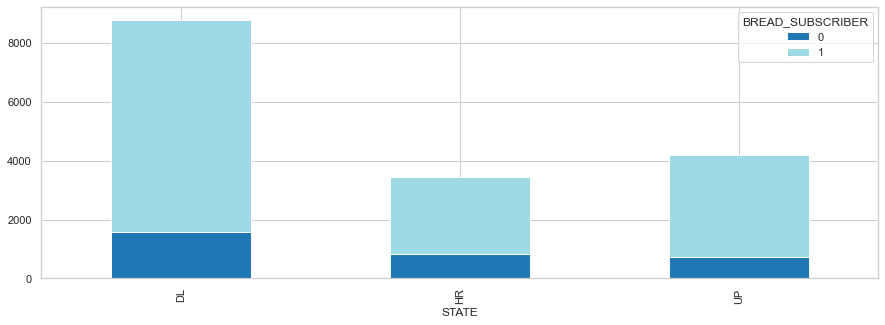

In [91]:
#Finding distribution of bread subscribers among states
df.groupby(['STATE', 'BREAD_SUBSCRIBER']).size().unstack().plot(kind='bar',colormap='tab20',stacked=True,figsize=(15, 5))



<AxesSubplot:xlabel='STATE'>

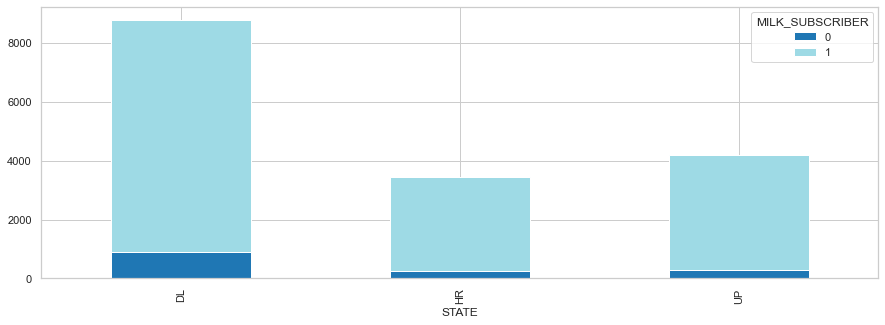

In [92]:
#Finding distribution of milk subscribers among states
df.groupby(['STATE', 'MILK_SUBSCRIBER']).size().unstack().plot(kind='bar',colormap='tab20',stacked=True, figsize=(15, 5))


D:\ANACONDA\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='STATE', ylabel='count'>

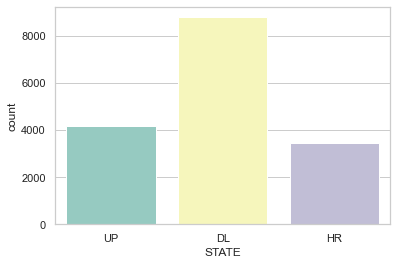

In [93]:
#Finding number of orders per state
sns.set_theme(style="whitegrid")
sns.countplot(df['STATE'],palette="Set3")

In [120]:
def Similarity1(id1,id2):
    a = neww1_df.iloc[id1]
    b = neww1_df.iloc[id2]
    
    A = a['order_items_bin']
    B = b['order_items_bin']
    
    C = a['category_bin']
    D = b['category_bin']
    
    E=a['vendor_bin']
    F=b['vendor_bin']
    
    zim1= (1-spatial.distance.cosine(A,B))
    zim2= (1-spatial.distance.cosine(C,D))
    zim3= (1-spatial.distance.cosine(E,F))
    
    return (zim1+zim2+zim3)/3

In [ ]:
import operator

def product():
    name = input('Enter product:  ')
    vendor=input('Enter vendor:  ')
    category=input('Enter category:  ')
    dict3={}
    name
    vendor
    category
    l=[]

    l.append(category)
    l.append(vendor)
    dict3[name]=l
    
    prod_df1=pd.DataFrame.from_dict(dict3,orient='index')
    prod_df1=prod_df1.reset_index()
    prod_df1.columns=['ORDER_ITEMS','ITEM_CATEGORIES','VENDOR_ATTRIBUTE']
    
    for i in range(len(prod_df1)):
        prod_df1['VENDOR_ATTRIBUTE'][i]=prod_df1['VENDOR_ATTRIBUTE'][i].split(',')
        prod_df1['ITEM_CATEGORIES'][i]=prod_df1['ITEM_CATEGORIES'][i].split(',')
        prod_df1['ORDER_ITEMS'][i]=prod_df1['ORDER_ITEMS'][i].split(',')
        
    prod_df1['order_items_bin']= prod_df1['ORDER_ITEMS'].apply(lambda x: binary(x))
    prod_df1['category_bin']= prod_df1['ITEM_CATEGORIES'].apply(lambda x: binary2(x))
    prod_df1['vendor_bin']=prod_df1['VENDOR_ATTRIBUTE'].apply(lambda x: binary3(x))  
    
    new_df1=df.append(prod_df1)
    new_df1=new_df1.reset_index()
    
    new_df1.drop(['index','level_0'],axis='columns',inplace=True)
    
    global neww1_df
    neww1_df=new_df1

    for i in range(len(neww1_df)):
        neww1_df['Similarity']=Similarity1(-1,i)
    
    for i in range(len(neww1_df)):
        neww1_df['Similarity'][i]=Similarity1(-1,i)
        
    top3=neww1_df[neww1_df['Similarity']<1]

    top3=top3.nlargest(7, ['Similarity'])

    top3=top3.reset_index()

    list_top3=[]

    for i in range(len(top3)):
        for j in range(len(top3['ORDER_ITEMS'][i])):
            # initialize an empty string
            if top3['ORDER_ITEMS'][i][j]!=name:
                list_top3.append(top3['ORDER_ITEMS'][i][j])
                
    list_top3=list(set(list_top3))
    
    print('Hey! You might like to have a look at the following products too! : \n ')
    
    return list_top3[:5]

In [161]:
product()

Enter product:  Almond Cookies (350 gm)
Enter vendor:  Organic German Bake Shop
Enter category:  Snacks and Beverages


<ipython-input-157-403d4fd62823>:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  neww1_df['Similarity'][i]=Similarity1(-1,i)


Hey! You might like to have a look at the following products too! : 
 


['Walnut Cookies (350 gm)',
 'Ragi &amp; Choco Chip Cookies (Gluten-free &amp; Vegan) (350 gm)',
 'Ragi & Walnut Cookies (Gluten-free & Vegan) (350 gm)',
 'Chocochips Cookies (300 gm)']

In [162]:
product()

Enter product:  Wheat Bansi atta (1 kg)
Enter vendor:  Desi Utpad by Jaya
Enter category:  Indian Grocery


<ipython-input-157-403d4fd62823>:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  neww1_df['Similarity'][i]=Similarity1(-1,i)


Hey! You might like to have a look at the following products too! : 
 


['Basmati Rice (1121) (1 kg)',
 'Kabuli chana (1 kg)',
 'Honey by Desi Utspad (400 gm)',
 'Moong chhilka dal (1 kg)',
 'Pink iodized desi salt (1 kg)']

In [163]:
product()

Enter product:  Watermelon (2 kg)
Enter vendor:  Kyssa Farms
Enter category:  Fruits and Veggies


<ipython-input-157-403d4fd62823>:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  neww1_df['Similarity'][i]=Similarity1(-1,i)


Hey! You might like to have a look at the following products too! : 
 


['Litchi (500 g)',
 'Mango Dussehri (3 kg)',
 'Avocado - (250 g)',
 'Ash Gourd - White Pumpkin (2.5 kg)',
 'Mango - Chausa (1kg)']

In [156]:
neww1_df

,ORDER_ID,CUSTOMER_ID,BREAD_SUBSCRIBER,MILK_SUBSCRIBER,STATE,ORDER_ITEMS,ITEM_CATEGORIES,VENDOR_ATTRIBUTE,order_items_bin,category_bin,vendor_bin,Similarity
0,31624.0,4157.0,1.0,1.0,UP,"[Parwal (500g), Soft Pear/ Babbugosha (500g), ...",[Fruits and Veggies],"[Kyssa Farms, Desi Utpad by Jaya]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, ...","[1, 0, 0, 0, 0, 0, 0]","[1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]",0.235702
1,6200.0,71.0,1.0,1.0,DL,"[Gruyere Cheese (200 gm), Amaranth Bread (Glut...","[Dairy, Snacks and Beverages, Spreads and Sauc...","[Organic German Bake Shop, Mr. Dairy]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 1, 1, 1, 1, 0, 0]","[0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]",0.000000
2,8523.0,532.0,1.0,1.0,DL,"[Feta Cheese Kodai (200 gm), Rye Ragi Bread (5...","[Dairy, Freshly Baked]","[Organic German Bake Shop, Mr. Dairy]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 1, 0, 0, 1, 0, 0]","[0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]",0.000000
3,35912.0,4667.0,1.0,1.0,DL,"[Onion Jam (210 gm), Miche Whole Wheat Sourdou...","[Spreads and Sauces, Freshly Baked]",[Miche Artisanal Bakery],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 1, 1, 0, 0]","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]",0.000000
4,8558.0,27.0,1.0,1.0,HR,"[Onion Jam (210 gm), Himalayan Montasio Cheese...","[Dairy, Spreads and Sauces, Freshly Baked]","[Mr. Dairy, Miche Artisanal Bakery]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 1, 0, 1, 1, 0, 0]","[0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]",0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
16423,21478.0,1269.0,1.0,1.0,DL,"[Miche Whole Wheat (550g), Sesame Bagels (Pack...",[Freshly Baked],[Miche Artisanal Bakery],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0]","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]",0.000000
16424,62937.0,1067.0,1.0,1.0,DL,"[Radish - Red (500g), Jackfruit (500g), Brinja...",[Fruits and Veggies],"[Kyssa Farms, Desi Utpad by Jaya]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 0, 0, 0, 0, 0, 0]","[1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]",0.235702
16425,19613.0,2750.0,1.0,0.0,UP,"[Ginger (250 gm), Cabbage - Green (500gm), Car...",[Fruits and Veggies],"[Kyssa Farms, Desi Utpad by Jaya]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 0, 0, 0, 0, 0, 0]","[1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]",0.235702
16426,11581.0,1073.0,1.0,1.0,HR,"[French Baguette (1 pc), Cinnamon Roll (Rosine...",[Freshly Baked],[Organic German Bake Shop],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0]","[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]",0.000000


In [ ]:
#end